## Sobel filter with OpenLane
---

## Introduction
---

This notebook shows the implementation of an edge detection filter based on the Sobel algorithm using the OpenLane tool and the open source SKY130 PDK technology.

This notebook will describe a part of a project called "soc image preprocessing" in which an edge detection filter is integrated. It will explain what this filter consists of, its implementation and those blocks that allow its integration with the pipeline of the entire project.

## Sobel algorithm

The below figure shows the procedure to follow to apply edge detection operators to an image. The image is traversed by convoluting the kernel of dimensions 3 × 3 by a matrix of neighboring pixels of the same dimension. Once the value of the convolution is obtained, its magnitude is found and, subsequently, a binarization is performed.

<div>
<img src = https://github.com/DianaNatali/soc_image_preprocessing/blob/master/docs/img/sobel_diagram.png?raw=true width = "600">
<div> 

The procedure described above is implemented in a core consisting of two blocks. One is in charge of managing the read and write requests and acknowledgements of the buffers that store the grayscale pixel and the output pixel of the sobel, with which it can control the block that loops through the image by selecting each time 8 neighboring pixels to the pixel of interest, with which a small buffer is filled. Later this buffer is sent to a subcore which convolves this matrix with the Sobel operator kernels performing fixed point operations, using bitwise shift operators, ie floating point arithmetic. The implementation of this subcore is described in
the figure below.


<div>
<img src = https://github.com/DianaNatali/soc_image_preprocessing/blob/master/docs/img/sobel_algorithm_diagram.png?raw=true width = 800>
<div>



## Some RTL diagrams
---

# Buffer reader  and buffer writer FSM

The images below show the RTL diagrams of the implementation of the blocks in charge of managing the reading and writing that the ip core sobel will do to the corresponding frame buffers.

<div>
<img src = https://github.com/DianaNatali/soc_image_preprocessing/blob/master/docs/img/RTL_buffer_reader_writer.png?raw=true width = "900">
<div>

# Sobel control 

The above diagram shows the implementation of the manager of the sobel ip core.

<div>
<img src = https://github.com/DianaNatali/soc_image_preprocessing/blob/master/docs/img/RTL_sobel_manager.png?raw=true width="450">
<div>

In [7]:
!python3 -m pip install --upgrade --no-cache-dir volare
!volare --version
!volare ls-remote --pdk sky130
!volare enable --pdk sky130 12df12e2e74145e31c5a13de02f9a1e176b56e67

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.5/237.5 KB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.1/91.1 KB 195.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.1/51.1 KB 146.9 MB/s eta 0:00:00
  Attempting uninstall: rich
    Found existing installation: rich 13.3.3
    Uninstalling rich-13.3.3:
      Successfully uninstalled rich-13.3.3
volare, version 0.7.1
Pre-built sky130 PDK versions
├── 12df12e2e74145e31c5a13de02f9a1e176b56e67 (2023.03.19)
├── e6f9c8876da77220403014b116761b0b2d79aab4 (2023.02.10)
├── 032b059033c4cf67f94c5b7f0a44d936b8ff5aae (2023.02.06)
├── 4cfc6af9ceba75a2f35c76f89ece76aa539f9a8d (2023.02.02)
├── 1cf0d5ddec191db3c878823ed0ded912319da9c6 (2023.01.30)
├── e884c4dcbf65101721529572ab6584f254e4f551 (2023.01.23)
├── 9f1c2b06d2b5a6708cfe0b55679c7e84d37220cc (2023.01.11)
├── 327e268bdb7191fe07a28bd40eeac055bba9dffd (2023.01

In [29]:
from google.colab import files
!ls ~/.volare/volare/sky130/versions/12df12e2e74145e31c5a13de02f9a1e176b56e67/sky130A/libs.ref/sky130_fd_sc_hd/verilog
!cd ~/.volare/volare/sky130/versions/12df12e2e74145e31c5a13de02f9a1e176b56e67/sky130A/libs.ref/sky130_fd_sc_hd/verilog
!cp ~/.volare/volare/sky130/versions/12df12e2e74145e31c5a13de02f9a1e176b56e67/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd.v ./
!cp ~/.volare/volare/sky130/versions/12df12e2e74145e31c5a13de02f9a1e176b56e67/sky130A/libs.ref/sky130_fd_sc_hd/verilog/primitives.v ./

primitives.v  sky130_fd_sc_hd.v


## Simulation 
---

Next, the respective simulation is carried out, where a first approximation is made comparing the implementation of the sobel filter in hardware using fixed point arithmetic, with an implementation made from the openCV library from Python, which uses floating point arithmetic, which is used as ground truth. Additionally, the input of both approaches corresponds to a grayscale image given by openCV, in the future it is intended to integrate the ip core that performs the grayscale conversion already implemented in hardware, using OpenLane. Additionally, a more accurate evaluation of the implementation will be sought that does not imply the comparison of fixed point vs. floating point arithmetic.

In [15]:
#@title Download verilog files of the project


!rm -rf soc_image_preprocessing
!git clone https://github.com/DianaNatali/soc_image_preprocessing.git
!rm -rf hardware
!mv soc_image_preprocessing/hardware .
!rm -rf soc_image_preprocessing

Cloning into 'soc_image_preprocessing'...
remote: Enumerating objects: 191, done.
remote: Counting objects: 100% (191/191), done.
remote: Compressing objects: 100% (142/142), done.
remote: Total 191 (delta 63), reused 165 (delta 37), pack-reused 0
Receiving objects: 100% (191/191), 2.03 MiB | 5.24 MiB/s, done.
Resolving deltas: 100% (63/63), done.


In [16]:
#@title Simulation of Sobel Hardware Implementation 

!apt-get install iverilog
import cv2
from matplotlib import pyplot as plt
import numpy as np

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-525
Use 'apt autoremove' to remove it.
Suggested packages:
  gtkwave
The following NEW packages will be installed:
  iverilog
0 upgraded, 1 newly installed, 0 to remove and 23 not upgraded.
Need to get 1,859 kB of archives.
After this operation, 6,547 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 iverilog amd64 10.3-1build1 [1,859 kB]
Fetched 1,859 kB in 1s (1,402 kB/s)
Selecting previously unselected package iverilog.
(Reading database ... 128703 files and directories currently installed.)
Preparing to unpack .../iverilog_10.3-1build1_amd64.deb ...
Unpacking iverilog (10.3-1build1) ...
Setting up iverilog (10.3-1build1) ...
Processing triggers for man-db (2.9.1-1) ...


In [17]:
img_original = cv2.imread('hardware/sobel/test_bench/monarch_320x240.jpg') 
gray_opencv = cv2.cvtColor(img_original, cv2.COLOR_BGR2GRAY) 

px_array = []
k = 0
for i in range(0,320): 
    for j in range(0,240):
        px_array.append(gray_opencv[j][i])
        k=k+1

with open('hardware/sobel/test_bench/monarch_320x240.txt', 'w') as f:
    for pixel in px_array:
        f.write(f"{pixel}\n")

In [18]:
!iverilog -o  sobel_control_TB hardware/sobel/test_bench/sobel_control_TB.v 

In [19]:
!vvp sobel_control_TB

VCD info: dumpfile sobel_control.vcd opened for output.


In [20]:
with open('hardware/sobel/test_bench/output_image_sobel.txt', 'r') as f:
    out_hw_txt = f.read().splitlines() 

arr_out_hw = np.array(out_hw_txt)
arr_out_hw_317x240 = np.reshape(arr_out_hw, (320, 240))

arr_out_hw_317x240_int = np.zeros(shape=(240, 315))
for i in range(0,315):
    for x in range(0,240):
        arr_out_hw_317x240_int[x][i] = int(arr_out_hw_317x240[i][x], 16)

cv2.imwrite('hardware/sobel/test_bench/sobel_verilog.jpg', arr_out_hw_317x240_int)
img_sobel_hw = cv2.imread('hardware/sobel/test_bench/sobel_verilog.jpg', 0)

In [21]:
sobelx = cv2.Sobel(gray_opencv,cv2.CV_64F,1,0,ksize=3)      
sobely = cv2.Sobel(gray_opencv,cv2.CV_64F,0,1,ksize=3)    
abs_grad_x = cv2.convertScaleAbs(sobelx)            
abs_grad_y = cv2.convertScaleAbs(sobely)

weight = 0.5
grad = cv2.addWeighted(abs_grad_x, weight, abs_grad_y, weight, 0)

grad1 = np.zeros(shape=(240, 315))
for i in range(0,240):
    for x in range(0,315):
        if(grad[i][x] < 150):
            grad1[i][x] = 0
        else:
            grad1[i][x] = 255
cv2.imwrite('sobel_openCV.jpg', grad1)

img_sobel_sw = cv2.imread('sobel_openCV.jpg', 0)

(Text(0.5, 1.0, 'Hardware implementation'), ([], []), ([], []))

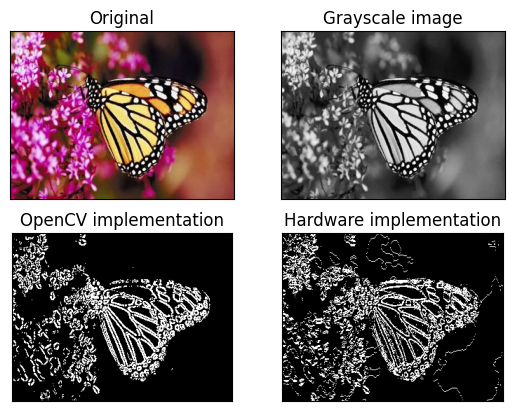

In [23]:
plt.subplot(2,2,1),plt.imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(gray_opencv, cmap = 'gray')
plt.title('Grayscale image'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(img_sobel_sw,cmap = 'gray')
plt.title('OpenCV implementation'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(img_sobel_hw,cmap = 'gray')
plt.title('Hardware implementation'), plt.xticks([]), plt.yticks([])

In [24]:
diff = cv2.absdiff(img_sobel_sw, img_sobel_hw)
cv2.imwrite("abs_diff.jpg", diff)

x3 = cv2.imread('abs_diff.jpg',0)
diff_1 = cv2.countNonZero(x3)

similarity = 1 - (diff_1 / (315 * 240))

print('% of simularity: {0:.0f}%'.format(similarity*100))

% of simularity: 58%


### Implementation
-----

In [11]:
#@title Install requirements {display-mode: "form"}
#@markdown - Click the ▷ button to setup the digital design environment based on [conda-eda](https://github.com/hdl/conda-eda).

openlane_version = 'latest' #@param {type:"string"}
open_pdks_version = 'latest' #@param {type:"string"}

if openlane_version == 'latest':
  openlane_version = ''
if open_pdks_version == 'latest':
  open_pdks_version = ''



import os
import pathlib

!curl -Ls https://micro.mamba.pm/api/micromamba/linux-64/latest | tar -xj bin/micromamba
conda_prefix_path = pathlib.Path('conda-env')
CONDA_PREFIX = str(conda_prefix_path.resolve())
!bin/micromamba create --yes --prefix $CONDA_PREFIX
!echo 'python ==3.7*' >> {CONDA_PREFIX}/conda-meta/pinned
!CI=0 bin/micromamba install --yes --prefix $CONDA_PREFIX \
                     --channel litex-hub \
                     --channel main \
                     openlane={openlane_version} \
                     open_pdks.sky130a={open_pdks_version} 
!python -m pip install gdstk gdstk
PATH = os.environ['PATH']
%env CONDA_PREFIX={CONDA_PREFIX}
%env PATH={CONDA_PREFIX}/bin:{PATH}


                                           __
          __  ______ ___  ____ _____ ___  / /_  ____ _
         / / / / __ `__ \/ __ `/ __ `__ \/ __ \/ __ `/
        / /_/ / / / / / / /_/ / / / / / / /_/ / /_/ /
       / .___/_/ /_/ /_/\__,_/_/ /_/ /_/_.___/\__,_/
      /_/

Empty environment created at prefix: /content/conda-env

                                           __
          __  ______ ___  ____ _____ ___  / /_  ____ _
         / / / / __ `__ \/ __ `/ __ `__ \/ __ \/ __ `/
        / /_/ / / / / / / /_/ / / / / / / /_/ / /_/ /
       / .___/_/ /_/ /_/\__,_/_/ /_/ /_/_.___/\__,_/
      /_/


Pinned packages:
  - python 3.7*


Transaction

  Prefix: /content/conda-env

  Updating specs:

   - openlane=*
   - open_pdks.sky130a=*


  Package                              Version  Build                 Channel                 Size
────────────────────────────────────────────────────────────────────────────────────────────────────
  Install:
──────────────────────────────────────────

### Write OpenLane Flow Configuration

In [12]:
%%writefile config.json
{
    "DESIGN_NAME": "sobel_control",
    "VERILOG_FILES": "dir::hardware/sobel/*.v",
    "CLOCK_PERIOD": 10,
    "CLOCK_NET": "i_clk",
    "CLOCK_PORT": "i_clk",

    "FP_SIZING": "absolute",
    "DIE_AREA": "0 0 300 200"
}

Writing config.json


### Run OpenLane Flow
---

In [13]:
%env PDK=sky130A
!flow.tcl -design .

env: PDK=sky130A
OpenLane 2023.03.01_0_ge10820ec-conda
All rights reserved. (c) 2020-2022 Efabless Corporation and contributors.
Available under the Apache License, version 2.0. See the LICENSE file for more details.

[INFO]: Using configuration in 'config.json'...
[INFO]: PDK Root: /content/conda-env/share/pdk
[INFO]: Process Design Kit: sky130A
[INFO]: Standard Cell Library: sky130_fd_sc_hd
[INFO]: Optimization Standard Cell Library: sky130_fd_sc_hd
[INFO]: Run Directory: /content/runs/RUN_2023.04.03_18.25.37
[INFO]: Preparing LEF files for the nom corner...
[INFO]: Preparing LEF files for the min corner...
[INFO]: Preparing LEF files for the max corner...
[STEP 1]
[INFO]: Running Synthesis (log: runs/RUN_2023.04.03_18.25.37/logs/synthesis/1-synthesis.log)...
[STEP 2]
[INFO]: Running Single-Corner Static Timing Analysis (log: runs/RUN_2023.04.03_18.25.37/logs/synthesis/2-sta.log)...
[STEP 3]
[INFO]: Running Initial Floorplanning (log: runs/RUN_2023.04.03_18.25.37/logs/floorplan/3-ini

In [25]:
import pathlib
import gdstk

gdss = sorted(pathlib.Path('runs').glob('*/results/final/gds/*.gds'))
library = gdstk.read_gds(gdss[-1])
top_cells = library.top_level()
top_cells[0].write_svg('sobel.svg')

In [26]:
!pip install svgutils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 34.4 MB/s eta 0:00:00


In [27]:
from IPython.display import SVG,display

display(SVG(filename='sobel.svg'))

In [28]:
import pandas as pd
import pathlib

pd.options.display.max_rows = None
final_summary_reports = sorted(pathlib.Path('runs').glob('*/reports/metrics.csv'))
df = pd.read_csv(final_summary_reports[-1])
df.transpose()

,0
design,/content
design_name,sobel_control
config,RUN_2023.04.03_18.25.37
flow_status,flow completed
total_runtime,0h7m49s0ms
routed_runtime,0h6m14s0ms
(Cell/mm^2)/Core_Util,70400.0
DIEAREA_mm^2,0.06
CellPer_mm^2,35200.0
OpenDP_Util,43.28
